# Lab 1: **Denoising the image with Deep Neural Network**
Welcome to COMSM0159 Advanced Visual AI (AVAI)!

The goal of this labsheet is to illustrate how to utilize the Deep Neural Network to denoise the image.

In this class, you will learn

1. How to generate the noisy image with python

2. How to set the parameters for the model and build new model for training.

3. Related techniques in training the model and evaluation

# Load T4 GPU in Colab

1.Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab

2.Load github resource

# Set up the parameters of Gaussian noise

1.Parmater **sigma** controls the magnitude of the noise.

2.PLOT shows whether you want to see the image.

In [79]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os

import numpy as np
from models import *

import torch
import torch.optim

from skimage.metrics import peak_signal_noise_ratio
from utils.denoising_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True

use_gpu = True

if use_gpu:
    dtype = torch.cuda.FloatTensor
else:
    dtype = torch.float32

print(f'GPU: {use_gpu}')

imsize =-1
PLOT = True

# Parameters of the Noise
sigma = 25
sigma_ = sigma/255.

GPU: True


# Choose the image for baseline

you can also upload some images here for further tests

In [80]:
## denoising
fname = 'data/denoising/F16_GT.png'

# Load the original image and that with noise

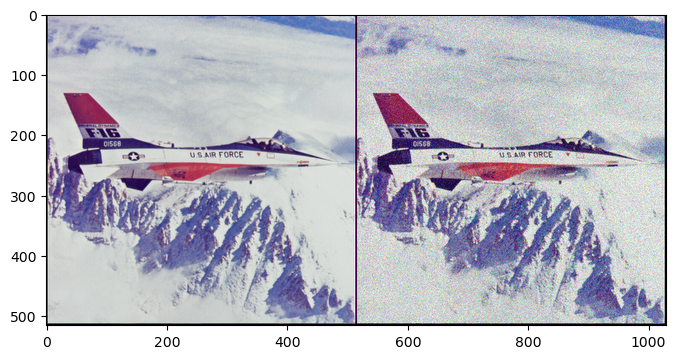

In [81]:
def get_noisy_image(img_np, sigma):

    img_noisy_np = np.clip(img_np + np.random.normal(scale=sigma, size=img_np.shape), 0, 1).astype(np.float32)
    img_noisy_pil = np_to_pil(img_noisy_np)

    return img_noisy_pil, img_noisy_np


# Compress the intensity of image to 0 ~ 1 and Add synthetic noise(Gaussin)
img_pil = crop_image(get_image(fname, imsize)[0], d=32)
img_np = pil_to_np(img_pil)

img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)

if PLOT:
    plot_image_grid([img_np, img_noisy_np], 4, 6)

**Practice 1**:
Write your own code for generate the noise from poisson distribution for the image.

**Example 1**: Noise from poisson distribution

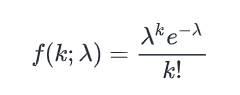

**Answer**

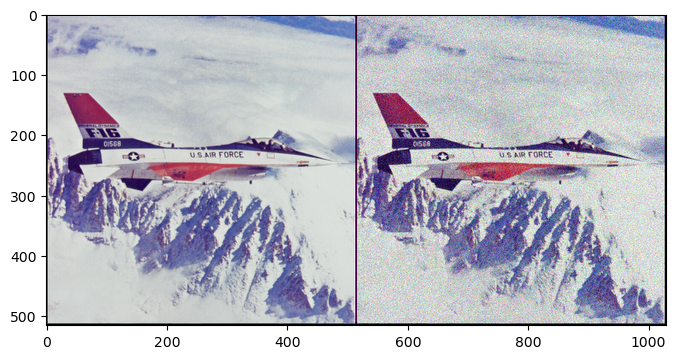

In [82]:
def get_possion_image(img_np, lam):

    img_noisy_np = np.clip(img_np + np.random.poisson(lam=0.3, size=img_np.shape), 0, 1).astype(np.float32)
    img_noisy_pil = np_to_pil(img_noisy_np)

    return img_noisy_pil, img_noisy_np

# Add synthetic noise(Gaussin)
img_pil = crop_image(get_image(fname, imsize)[0], d=32)
img_np = pil_to_np(img_pil)

img_poisson_pil, img_poisson_np = get_noisy_image(img_np, sigma_)

if PLOT:
    plot_image_grid([img_np, img_poisson_np], 4, 6)

**Further practice**

Try to add different kinds of noise to the image and check the difference.

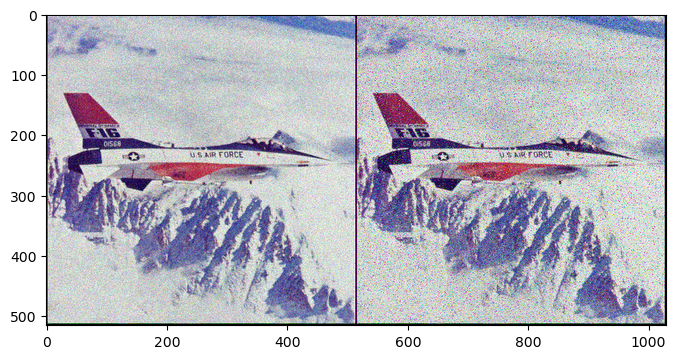

In [93]:
def get_noisy_image_salt_pepper(img_np, prob):

    img_noisy_np = np.copy(img_np)
    salt_pepper_mask = np.random.choice([0, 1, 2], size=img_np.shape, p=[prob / 2, prob / 2, 1 - prob])
    img_noisy_np[salt_pepper_mask == 0] = 0
    img_noisy_np[salt_pepper_mask == 1] = 1

    img_noisy_pil = np_to_pil(img_noisy_np)
    return img_noisy_pil, img_noisy_np

prob = 0.05
img_pil = crop_image(get_image(fname, imsize)[0], d=32)
img_np = pil_to_np(img_poisson_pil)

img_salt_pil, img_salt_np = get_noisy_image_salt_pepper(img_np, prob)

if PLOT:
    plot_image_grid([img_np, img_salt_np], 4, 6)

# Set up the parameters for training

Main parameters

1. **num_iter** controls the number of iterations for training

2. **LR** controls the learning rate

3. Two types of **optimizer** exists here. (1) **adam** (2)
 **LBFGS**

In function **get_net**, there exists five types of Neural Network (1) **ResNet** (2) **skip** (3) **texture_nets** (4) **UNet** (5) **identity**


Variable **mse** controls the type of loss here.

In [86]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

#training parameters
reg_noise_std = 1./30.
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99

num_iter = 500
input_depth = 3
figsize = 4
random_noise = False

#Network structure
net = get_net(input_depth, 'skip', pad,
              skip_n33d=128,
              skip_n33u=128,
              skip_n11=4,
              num_scales=5,
              upsample_mode='bilinear').type(dtype)

# whether to generate random noise or noisy image
if random_noise:
    net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()
else:
    net_input = np_to_torch(img_noisy_np).type(dtype)

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]);
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)
img_torch = np_to_torch(img_np).type(dtype)

Number of params: 2184307


**Exercise 2**:

try to change the parameters of the network.

**Example 1**:

In [114]:
# define the ResNet model

INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

#training parameters
reg_noise_std = 1./30.
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99

num_iter = 500
input_depth = 3
figsize = 4
random_noise = False

#Network structure
net_ResNet = get_net(input_depth, 'ResNet', pad, upsample_mode='bilinear').type(dtype)

# whether to generate random noise or noisy image
if random_noise:
    net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()
else:
    net_input = np_to_torch(img_salt_np).type(dtype)

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]);
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_salt_np).type(dtype)
img_torch = np_to_torch(img_np).type(dtype)

Number of params: 49955


**Architecture of the Network of skip**

In [115]:
import torch
import torch.nn as nn
from models.common import *

def skip(
        num_input_channels=2, num_output_channels=3,
        num_channels_down=[16, 32, 64, 128, 128], num_channels_up=[16, 32, 64, 128, 128], num_channels_skip=[4, 4, 4, 4, 4],
        filter_size_down=3, filter_size_up=3, filter_skip_size=1,
        need_sigmoid=True, need_bias=True,
        pad='zero', upsample_mode='nearest', downsample_mode='stride', act_fun='LeakyReLU',
        need1x1_up=True):
    """Assembles encoder-decoder with skip connections.

    Arguments:
        act_fun: Either string 'LeakyReLU|Swish|ELU|none' or module (e.g. nn.ReLU)
        pad (string): zero|reflection (default: 'zero')
        upsample_mode (string): 'nearest|bilinear' (default: 'nearest')
        downsample_mode (string): 'stride|avg|max|lanczos2' (default: 'stride')

    """
    assert len(num_channels_down) == len(num_channels_up) == len(num_channels_skip)

    n_scales = len(num_channels_down)

    if not (isinstance(upsample_mode, list) or isinstance(upsample_mode, tuple)) :
        upsample_mode   = [upsample_mode]*n_scales

    if not (isinstance(downsample_mode, list)or isinstance(downsample_mode, tuple)):
        downsample_mode   = [downsample_mode]*n_scales

    if not (isinstance(filter_size_down, list) or isinstance(filter_size_down, tuple)) :
        filter_size_down   = [filter_size_down]*n_scales

    if not (isinstance(filter_size_up, list) or isinstance(filter_size_up, tuple)) :
        filter_size_up   = [filter_size_up]*n_scales

    last_scale = n_scales - 1

    cur_depth = None

    model = nn.Sequential()
    model_tmp = model

    input_depth = num_input_channels
    for i in range(len(num_channels_down)):

        deeper = nn.Sequential()
        skip = nn.Sequential()

        if num_channels_skip[i] != 0:
            model_tmp.add(Concat(1, skip, deeper))
        else:
            model_tmp.add(deeper)

        model_tmp.add(bn(num_channels_skip[i] + (num_channels_up[i + 1] if i < last_scale else num_channels_down[i])))

        if num_channels_skip[i] != 0:
            skip.add(conv(input_depth, num_channels_skip[i], filter_skip_size, bias=need_bias, pad=pad))
            skip.add(bn(num_channels_skip[i]))
            skip.add(act(act_fun))

        # skip.add(Concat(2, GenNoise(nums_noise[i]), skip_part))

        deeper.add(conv(input_depth, num_channels_down[i], filter_size_down[i], 2, bias=need_bias, pad=pad, downsample_mode=downsample_mode[i]))
        deeper.add(bn(num_channels_down[i]))
        deeper.add(act(act_fun))

        deeper.add(conv(num_channels_down[i], num_channels_down[i], filter_size_down[i], bias=need_bias, pad=pad))
        deeper.add(bn(num_channels_down[i]))
        deeper.add(act(act_fun))

        deeper_main = nn.Sequential()

        if i == len(num_channels_down) - 1:
            # The deepest
            k = num_channels_down[i]
        else:
            deeper.add(deeper_main)
            k = num_channels_up[i + 1]

        deeper.add(nn.Upsample(scale_factor=2, mode=upsample_mode[i]))

        model_tmp.add(conv(num_channels_skip[i] + k, num_channels_up[i], filter_size_up[i], 1, bias=need_bias, pad=pad))
        model_tmp.add(bn(num_channels_up[i]))
        model_tmp.add(act(act_fun))


        if need1x1_up:
            model_tmp.add(conv(num_channels_up[i], num_channels_up[i], 1, bias=need_bias, pad=pad))
            model_tmp.add(bn(num_channels_up[i]))
            model_tmp.add(act(act_fun))

        input_depth = num_channels_down[i]
        model_tmp = deeper_main

    model.add(conv(num_channels_up[0], num_output_channels, 1, bias=need_bias, pad=pad))
    if need_sigmoid:
        model.add(nn.Sigmoid())

    return model

Now you know the architecture of the network skip, try to **modify different parameters** for test

In [116]:
from models.texture_nets import get_texture_nets
from models.resnet import ResNet
from models.unet import UNet

import torch.nn as nn

def get_net(input_depth, NET_TYPE, pad, upsample_mode, n_channels=3, act_fun='LeakyReLU', skip_n33d=128, skip_n33u=128, skip_n11=4, num_scales=5, downsample_mode='stride'):
    if NET_TYPE == 'ResNet':
        # TODO
        net = ResNet(num_input_channels=3, num_output_channels=3, num_blocks=10, num_channels=16, need_residual=True, act_fun='LeakyReLU', need_sigmoid=True, norm_layer=nn.BatchNorm2d, pad='reflection')
    elif NET_TYPE == 'skip':
        net = skip(input_depth, n_channels, num_channels_down = [skip_n33d]*num_scales if isinstance(skip_n33d, int) else skip_n33d,
                                            num_channels_up =   [skip_n33u]*num_scales if isinstance(skip_n33u, int) else skip_n33u,
                                            num_channels_skip = [skip_n11]*num_scales if isinstance(skip_n11, int) else skip_n11,
                                            upsample_mode=upsample_mode, downsample_mode=downsample_mode,
                                            need_sigmoid=True, need_bias=True, pad=pad, act_fun=act_fun)

    elif NET_TYPE == 'texture_nets':
        net = get_texture_nets(inp=input_depth, ratios = [32, 16, 8, 4, 2, 1], fill_noise=False,pad=pad)

    elif NET_TYPE =='UNet':
        net = UNet(num_input_channels=input_depth, num_output_channels=3,
                   feature_scale=4, more_layers=0, concat_x=False,
                   upsample_mode=upsample_mode, pad=pad, norm_layer=nn.BatchNorm2d, need_sigmoid=True, need_bias=True)
    elif NET_TYPE == 'identity':
        assert input_depth == 3
        net = nn.Sequential()
    else:
        assert False

    return net


INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

#training parameters
reg_noise_std = 1./30.
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99

num_iter = 500
input_depth = 3
figsize = 4
random_noise = False

#Network structure
net = get_net(input_depth, 'skip', pad,
              skip_n33d=128,
              skip_n33u=128,
              skip_n11=4,
              num_scales=5,
              upsample_mode='bilinear').type(dtype)
# whether to generate random noise or noisy image
if random_noise:
    net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()
else:
    net_input = np_to_torch(img_noisy_np).type(dtype)

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]);
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)
img_torch = np_to_torch(img_np).type(dtype)

Number of params: 2184307


**Further practice (Challenge)**:

Now create your own model for training

In [117]:
# define the ResNet model

INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

#training parameters
reg_noise_std = 1./30.
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99

num_iter = 500
input_depth = 3
figsize = 4
random_noise = False

#Network structure
net_ResNet = get_net(input_depth, 'ResNet', pad, upsample_mode='bilinear').type(dtype)

# whether to generate random noise or noisy image
if random_noise:
    net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()
else:
    net_input = np_to_torch(img_salt_np).type(dtype)

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]);
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_salt_np).type(dtype)
img_torch = np_to_torch(img_np).type(dtype)

Number of params: 2184307


# Start to train the network

PSNR is a standard to evaluate the quality of signal.

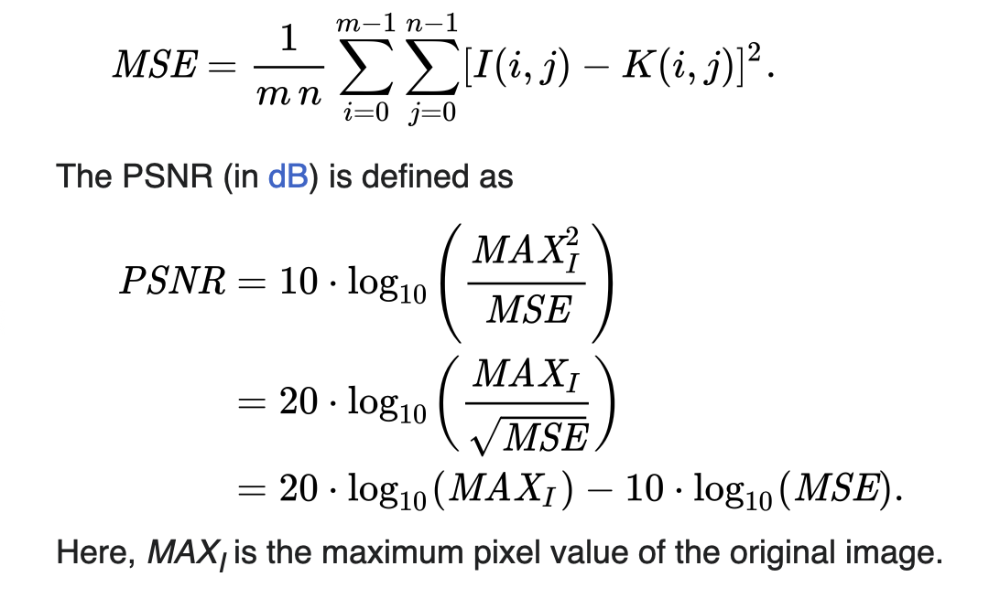

**PSNR for image**

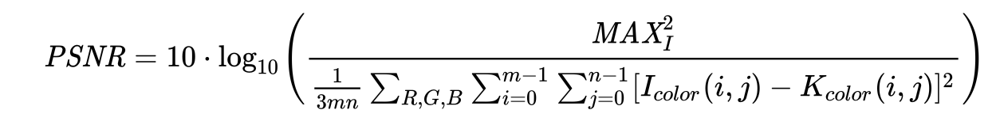

Starting optimization with ADAM
Iteration:  0  Loss:  0.0936872586607933  PSRN_gt:  10.283194868423056  PSNR_gt_sm:  17.567402751298367


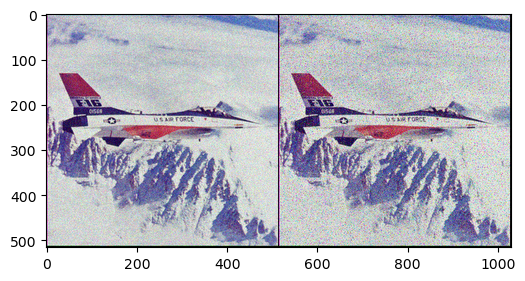

Iteration:  10  Loss:  0.024048632010817528  PSRN_gt:  16.189096254735276  PSNR_gt_sm:  18.215851551446143
Iteration:  20  Loss:  0.017201773822307587  PSRN_gt:  17.644267503703624  PSNR_gt_sm:  18.898904676564886
Iteration:  30  Loss:  0.014365382492542267  PSRN_gt:  18.42682810601619  PSNR_gt_sm:  19.484049067951123
Iteration:  40  Loss:  0.012643544934689999  PSRN_gt:  18.98131160119696  PSNR_gt_sm:  19.95605380549336
Iteration:  50  Loss:  0.015273827128112316  PSRN_gt:  18.160521376143016  PSNR_gt_sm:  20.35974292169897
Iteration:  60  Loss:  0.014054379425942898  PSRN_gt:  18.52188322575842  PSNR_gt_sm:  20.601216604073667
Iteration:  70  Loss:  0.01168250571936369  PSRN_gt:  19.324640389986993  PSNR_gt_sm:  20.838299025250585
Iteration:  80  Loss:  0.010938793420791626  PSRN_gt:  19.610305877605107  PSNR_gt_sm:  21.063714424248154
Iteration:  90  Loss:  0.010416809469461441  PSRN_gt:  19.822652952454224  PSNR_gt_sm:  21.213853355803817
Iteration:  100  Loss:  0.01008904725313186

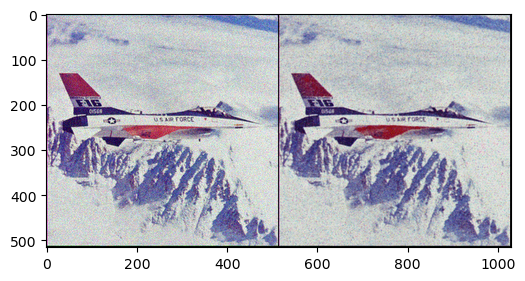

Iteration:  110  Loss:  0.0098995640873909  PSRN_gt:  20.043839331389655  PSNR_gt_sm:  21.368217715745843
Iteration:  120  Loss:  0.00963740237057209  PSRN_gt:  20.160400585831898  PSNR_gt_sm:  21.392434019615738
Iteration:  130  Loss:  0.009379178285598755  PSRN_gt:  20.27835240153342  PSNR_gt_sm:  21.396726780804745
Iteration:  140  Loss:  0.009186148643493652  PSRN_gt:  20.368665359178053  PSNR_gt_sm:  21.388453241052797
Iteration:  150  Loss:  0.00889703631401062  PSRN_gt:  20.50754601505181  PSNR_gt_sm:  21.37482228972261
Iteration:  160  Loss:  0.00866041798144579  PSRN_gt:  20.624611725059495  PSNR_gt_sm:  21.360841931180662
Iteration:  170  Loss:  0.008514023385941982  PSRN_gt:  20.698651993560183  PSNR_gt_sm:  21.347982279367393
Iteration:  180  Loss:  0.00815689004957676  PSRN_gt:  20.884754245455518  PSNR_gt_sm:  21.34190298529871
Iteration:  190  Loss:  0.00789203867316246  PSRN_gt:  21.02810788532963  PSNR_gt_sm:  21.345952664565534
Iteration:  200  Loss:  0.00764573924243

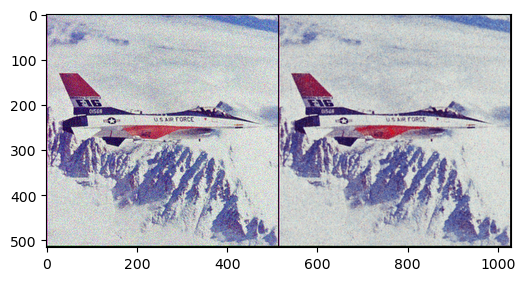

Iteration:  210  Loss:  0.00745840510353446  PSRN_gt:  21.273540287933127  PSNR_gt_sm:  21.388542926592926
Iteration:  220  Loss:  0.007119588553905487  PSRN_gt:  21.475451143614972  PSNR_gt_sm:  21.430239121156593
Iteration:  230  Loss:  0.007917183451354504  PSRN_gt:  21.014293233988415  PSNR_gt_sm:  21.483587462602635
Iteration:  240  Loss:  0.006942476145923138  PSRN_gt:  21.58485593846821  PSNR_gt_sm:  21.542449851017338
Iteration:  250  Loss:  0.006461193785071373  PSRN_gt:  21.896872361161442  PSNR_gt_sm:  21.61915228502638
Iteration:  260  Loss:  0.006210810970515013  PSRN_gt:  22.06851703069654  PSNR_gt_sm:  21.708803780809255
Iteration:  270  Loss:  0.006016043946146965  PSRN_gt:  22.20689005349569  PSNR_gt_sm:  21.810964873103728
Iteration:  280  Loss:  0.0057513294741511345  PSRN_gt:  22.402317670539418  PSNR_gt_sm:  21.921115158254487
Iteration:  290  Loss:  0.005531438626348972  PSRN_gt:  22.57161955742731  PSNR_gt_sm:  22.039878285720647
Iteration:  300  Loss:  0.0053847

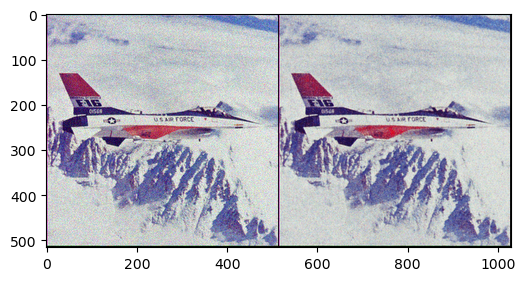

Iteration:  310  Loss:  0.005148053169250488  PSRN_gt:  22.883569710408686  PSNR_gt_sm:  22.29637560126488
Iteration:  320  Loss:  0.005051434971392155  PSRN_gt:  22.965852727259282  PSNR_gt_sm:  22.43606151625782
Iteration:  330  Loss:  0.004841174464672804  PSRN_gt:  23.150492805625063  PSNR_gt_sm:  22.576022652291
Iteration:  340  Loss:  0.004684475250542164  PSRN_gt:  23.29339061222123  PSNR_gt_sm:  22.720397642540394
Iteration:  350  Loss:  0.004541476722806692  PSRN_gt:  23.42802907268738  PSNR_gt_sm:  22.86880266854257
Iteration:  360  Loss:  0.004394156858325005  PSRN_gt:  23.571244652265367  PSNR_gt_sm:  23.02095492437614
Iteration:  370  Loss:  0.004245210438966751  PSRN_gt:  23.721008161967067  PSNR_gt_sm:  23.174709983466983
Iteration:  380  Loss:  0.0041625346057116985  PSRN_gt:  23.806421323034446  PSNR_gt_sm:  23.33124086065571
Iteration:  390  Loss:  0.004146093036979437  PSRN_gt:  23.823609668178616  PSNR_gt_sm:  23.485043426517333
Iteration:  400  Loss:  0.00408431328

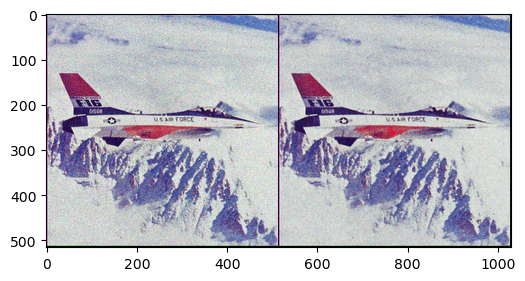

Iteration:  410  Loss:  0.003930756822228432  PSRN_gt:  24.05523792247873  PSNR_gt_sm:  23.773523598813668
Iteration:  420  Loss:  0.003859139047563076  PSRN_gt:  24.13509558971894  PSNR_gt_sm:  23.911723946483136
Iteration:  430  Loss:  0.0037778771948069334  PSRN_gt:  24.227522025521274  PSNR_gt_sm:  24.043102780435973
Iteration:  440  Loss:  0.003754603210836649  PSRN_gt:  24.254359845212917  PSNR_gt_sm:  24.165873989203114
Iteration:  450  Loss:  0.0037162478547543287  PSRN_gt:  24.298953577290273  PSNR_gt_sm:  24.280031287433612
Iteration:  460  Loss:  0.0037579394411295652  PSRN_gt:  24.250502203650864  PSNR_gt_sm:  24.3886044269664
Iteration:  470  Loss:  0.0037168916314840317  PSRN_gt:  24.298201038177886  PSNR_gt_sm:  24.48008326910707
Iteration:  480  Loss:  0.003612163010984659  PSRN_gt:  24.422326704620467  PSNR_gt_sm:  24.57201788668401
Iteration:  490  Loss:  0.0035922150127589703  PSRN_gt:  24.446377088238016  PSNR_gt_sm:  24.660571387714114


In [119]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
#smoothing image
out_avg = net_input_saved

#without smoothing
#out_avg = None

last_net = None
psrn_noisy_last = 0

i = 0
def closure():

    global i, out_avg, psrn_noisy_last, last_net, net_input

    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out = net_ResNet(net_input)

    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)

    #total_loss = mse(out, img_noisy_torch)
    total_loss = mse(out, img_torch)
    total_loss.backward()

    #evaluation with psrn
    psrn_noisy = peak_signal_noise_ratio(img_salt_np, out.detach().cpu().numpy()[0])   # the noise image
    psrn_gt    = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0])
    psrn_gt_sm = peak_signal_noise_ratio(img_np, out_avg.detach().cpu().numpy()[0])

    if  PLOT and i % 10 == 0:
        print ('Iteration: ', i, ' Loss: ', total_loss.item(), ' PSRN_gt: ', psrn_gt, ' PSNR_gt_sm: ', psrn_gt_sm)
    #print ('Iteration %05d    Loss %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_gt, psrn_gt_sm), '\r', end='')
    if  PLOT and i % show_every == 0:
        #out_np = torch_to_np(out)
        plot_image_grid([np.clip(img_np, 0, 1),
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=2)



    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5:
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy

    i += 1

    return total_loss

p = get_params(OPT_OVER, net_ResNet, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

Starting optimization with ADAM
Iteration:  0  Loss:  0.10586120933294296  PSRN_gt:  9.752631731917733  PSNR_gt_sm:  17.294473095607565


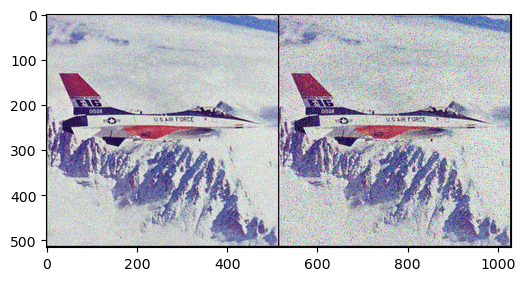

Iteration:  10  Loss:  0.025874391198158264  PSRN_gt:  15.871298926296495  PSNR_gt_sm:  18.002967464749613
Iteration:  20  Loss:  0.014732493087649345  PSRN_gt:  18.31723796051844  PSNR_gt_sm:  18.65846439193408
Iteration:  30  Loss:  0.012454262934625149  PSRN_gt:  19.046819754686314  PSNR_gt_sm:  19.280906464220504
Iteration:  40  Loss:  0.01145056914538145  PSRN_gt:  19.41172953710263  PSNR_gt_sm:  19.81226612630152
Iteration:  50  Loss:  0.010568267665803432  PSRN_gt:  19.75996215226912  PSNR_gt_sm:  20.25139480815019
Iteration:  60  Loss:  0.009736376814544201  PSRN_gt:  20.116026498743945  PSNR_gt_sm:  20.60081529051238
Iteration:  70  Loss:  0.008995242416858673  PSRN_gt:  20.45987153314868  PSNR_gt_sm:  20.850584162827236
Iteration:  80  Loss:  0.00846103485673666  PSRN_gt:  20.725765148876818  PSNR_gt_sm:  21.020153867626053
Iteration:  90  Loss:  0.008231109008193016  PSRN_gt:  20.845417015379  PSNR_gt_sm:  21.148464983553552
Iteration:  100  Loss:  0.00782027281820774  PSRN_

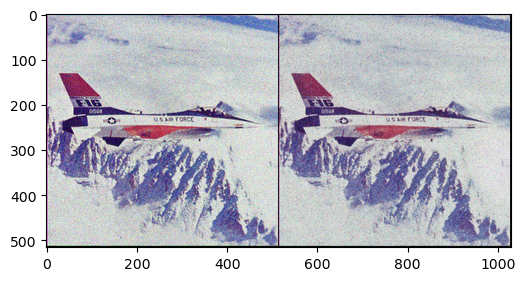

Iteration:  110  Loss:  0.007501648738980293  PSRN_gt:  21.24843286784429  PSNR_gt_sm:  21.333848319057086
Iteration:  120  Loss:  0.007089072372764349  PSRN_gt:  21.49410619048612  PSNR_gt_sm:  21.41311316161795
Iteration:  130  Loss:  0.006568855606019497  PSRN_gt:  21.825102654461865  PSNR_gt_sm:  21.497919939277462
Iteration:  140  Loss:  0.006295009981840849  PSRN_gt:  22.01003589149883  PSNR_gt_sm:  21.588963414885647
Iteration:  150  Loss:  0.0061310697346925735  PSRN_gt:  22.124637583318815  PSNR_gt_sm:  21.68326836026365
Iteration:  160  Loss:  0.005842036567628384  PSRN_gt:  22.33435724484087  PSNR_gt_sm:  21.784539315545043
Iteration:  170  Loss:  0.00563798937946558  PSRN_gt:  22.48875762339276  PSNR_gt_sm:  21.895043544047446
Iteration:  180  Loss:  0.005491118412464857  PSRN_gt:  22.60339183975021  PSNR_gt_sm:  22.01016353795214
Iteration:  190  Loss:  0.005583941470831633  PSRN_gt:  22.53059174819216  PSNR_gt_sm:  22.121370527554653
Iteration:  200  Loss:  0.005274279974

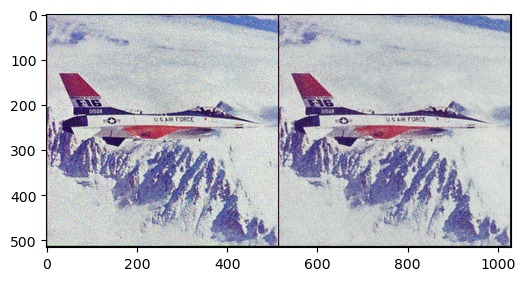

Iteration:  210  Loss:  0.00509865116328001  PSRN_gt:  22.92544742668821  PSNR_gt_sm:  22.360002047633785
Iteration:  220  Loss:  0.0051628644578158855  PSRN_gt:  22.871093074265826  PSNR_gt_sm:  22.483743238231398
Iteration:  230  Loss:  0.004897936712950468  PSRN_gt:  23.099868393743527  PSNR_gt_sm:  22.605195395579827
Iteration:  240  Loss:  0.004765374585986137  PSRN_gt:  23.219029712799816  PSNR_gt_sm:  22.72740508450303
Iteration:  250  Loss:  0.0046935779973864555  PSRN_gt:  23.28495994849323  PSNR_gt_sm:  22.847835240101663
Iteration:  260  Loss:  0.004609943833202124  PSRN_gt:  23.363043704798592  PSNR_gt_sm:  22.963540539477883
Iteration:  270  Loss:  0.004566436633467674  PSRN_gt:  23.40422576072054  PSNR_gt_sm:  23.07504289764944
Iteration:  280  Loss:  0.004539888352155685  PSRN_gt:  23.42954870210828  PSNR_gt_sm:  23.18015746348697
Iteration:  290  Loss:  0.004458402283489704  PSRN_gt:  23.508207695577568  PSNR_gt_sm:  23.28135561793121
Iteration:  300  Loss:  0.004362429

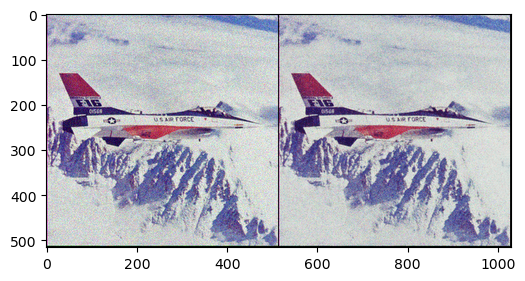

Iteration:  310  Loss:  0.004472118802368641  PSRN_gt:  23.494867088285734  PSNR_gt_sm:  23.48081344134041
Iteration:  320  Loss:  0.004326673224568367  PSRN_gt:  23.638459084320836  PSNR_gt_sm:  23.573794109508626
Iteration:  330  Loss:  0.004345510620623827  PSRN_gt:  23.619592093113564  PSNR_gt_sm:  23.661892942283146
Iteration:  340  Loss:  0.0043315705843269825  PSRN_gt:  23.633546342459823  PSNR_gt_sm:  23.748648515981806
Iteration:  350  Loss:  0.0049919369630515575  PSRN_gt:  23.017309071657618  PSNR_gt_sm:  23.797142456067405
Iteration:  360  Loss:  0.004567225929349661  PSRN_gt:  23.40347509450593  PSNR_gt_sm:  23.838054414740405
Iteration:  370  Loss:  0.0043462542816996574  PSRN_gt:  23.618849019917242  PSNR_gt_sm:  23.89516569028686
Iteration:  380  Loss:  0.004214827436953783  PSRN_gt:  23.752201932858007  PSNR_gt_sm:  23.9645708896319
Iteration:  390  Loss:  0.004076565150171518  PSRN_gt:  23.897056368051423  PSNR_gt_sm:  24.031409538809626
Iteration:  400  Loss:  0.0040

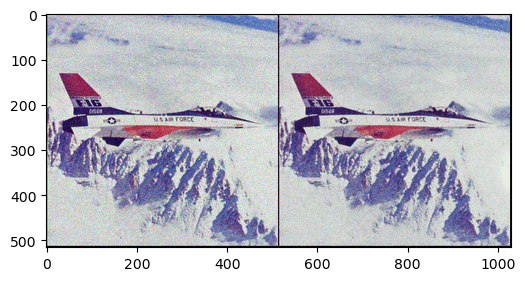

Iteration:  410  Loss:  0.003939367365092039  PSRN_gt:  24.04573502117954  PSNR_gt_sm:  24.174850442592636
Iteration:  420  Loss:  0.003906789235770702  PSRN_gt:  24.081800329139114  PSNR_gt_sm:  24.24428816421386
Iteration:  430  Loss:  0.003957951441407204  PSRN_gt:  24.02529527543896  PSNR_gt_sm:  24.30873865630136
Iteration:  440  Loss:  0.0039979382418096066  PSRN_gt:  23.98163941622142  PSNR_gt_sm:  24.36057103452384
Iteration:  450  Loss:  0.003917500842362642  PSRN_gt:  24.06990906750114  PSNR_gt_sm:  24.40814712656354
Iteration:  460  Loss:  0.003842004342004657  PSRN_gt:  24.154421702582603  PSNR_gt_sm:  24.45745652643637
Iteration:  470  Loss:  0.0038911576848477125  PSRN_gt:  24.099211548595513  PSNR_gt_sm:  24.50563800906569
Iteration:  480  Loss:  0.0037933182902634144  PSRN_gt:  24.209807298652166  PSNR_gt_sm:  24.549922661616208
Iteration:  490  Loss:  0.0037606905680149794  PSRN_gt:  24.247324134123197  PSNR_gt_sm:  24.59390397669203


In [120]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
#smoothing image
out_avg = net_input_saved

#without smoothing
#out_avg = None

last_net = None
psrn_noisy_last = 0

i = 0
def closure():

    global i, out_avg, psrn_noisy_last, last_net, net_input

    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out = net(net_input)

    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)

    #total_loss = mse(out, img_noisy_torch)
    total_loss = mse(out, img_torch)
    total_loss.backward()

    #evaluation with psrn
    psrn_noisy = peak_signal_noise_ratio(img_salt_np, out.detach().cpu().numpy()[0])   # the noise image
    psrn_gt    = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0])
    psrn_gt_sm = peak_signal_noise_ratio(img_np, out_avg.detach().cpu().numpy()[0])

    if  PLOT and i % 10 == 0:
        print ('Iteration: ', i, ' Loss: ', total_loss.item(), ' PSRN_gt: ', psrn_gt, ' PSNR_gt_sm: ', psrn_gt_sm)
    #print ('Iteration %05d    Loss %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_gt, psrn_gt_sm), '\r', end='')
    if  PLOT and i % show_every == 0:
        #out_np = torch_to_np(out)
        plot_image_grid([np.clip(img_np, 0, 1),
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=2)



    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5:
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy

    i += 1

    return total_loss

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

# Show the result

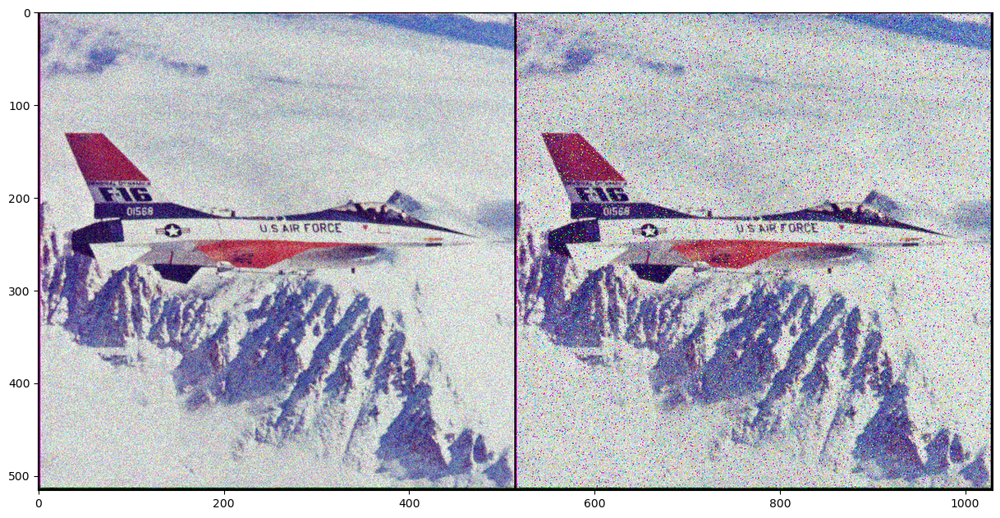

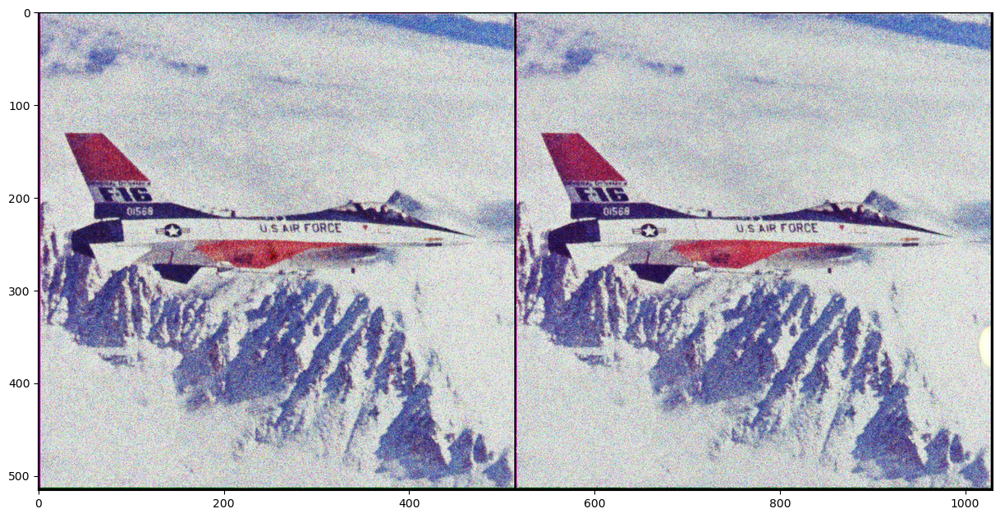

In [124]:
out_skip_np = torch_to_np(net(net_input))
out_resnet_np = torch_to_np(net_ResNet(net_input))
if PLOT:
    plot_image_grid([img_np, img_salt_np], factor=13)
    plot_image_grid([ out_resnet_np, out_skip_np], factor=13)